In [1]:
import funkcje_pischarnik as f
import numpy as np
import skimage.io as io
import matplotlib.pyplot as plt




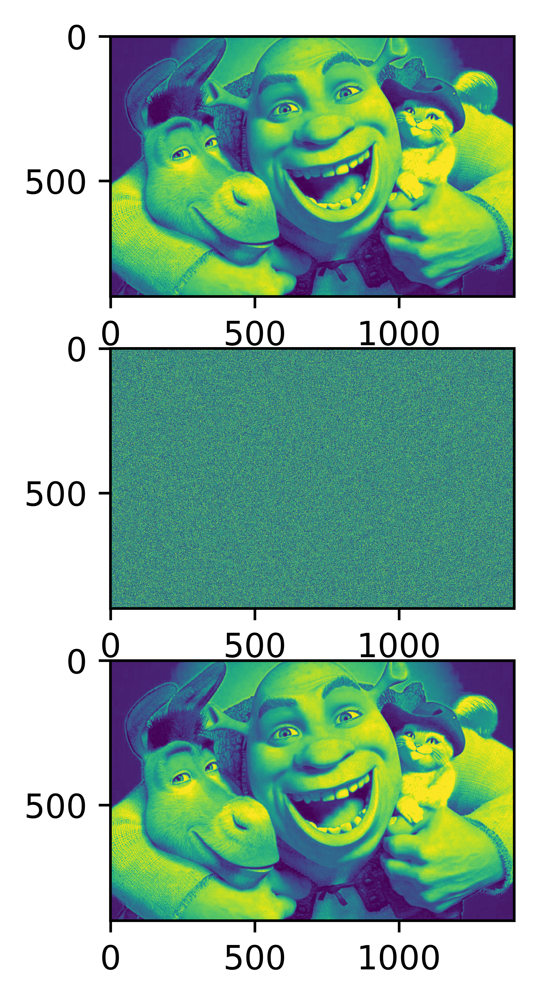

In [7]:



img = io.imread('../resources/shrek.jpg')

plt.figure(dpi = 1000)
plt.subplot(3, 1, 1)
plt.imshow(img[...,0])

x, y, z = img.shape
img = img.reshape(x*y, z)

red = img[...,0]

maks = 0.975
mini = 0.095062
iter_j = 3
iter_i = 10
a = 3.9

red_c = f.x_c(mini, f.dx(maks, mini), red)



red_norm = np.copy(red_c)
for i in range(iter_j):

    red_norm = f.normalise(red_norm, maks, mini)
    red_norm = f.iterations(red_norm, iter_i, a, maks)


plt.subplot(3, 1, 2)
plt.imshow(red_norm.reshape(x, y))

red_inv = np.copy(red_norm)
for i in range(iter_j):
    red_inv = f.reverse_iterations(red_inv, iter_i, a, maks, mini)
    red_inv = f.reverse_normalise(red_inv, maks, mini)



red = f.x_c_reverse(mini, f.dx(maks, mini), red_inv)


plt.subplot(3, 1, 3)
plt.imshow(red.reshape(x, y))



